## 1.0 Imports e Funções

### 1.1 Imports

In [222]:
import pandas as pd
import numpy as np
import inflection
import seaborn as sns
import matplotlib.pyplot as plt 
import association_metrics as am
import pickle
import category_encoders as ce
from sklearn.model_selection import train_test_split
from sklearn import preprocessing   as pp
from IPython.display import Image, display
from plotnine import (
                        ggplot,
                        aes,
                        after_stat,
                        stage,
                        geom_bar,
                        geom_text,
                        geom_label,
                        position_dodge2,
                        facet_wrap)
import plotly.express as px
from scipy import stats as ss

### 1.2 Funções

In [2]:
def prop_per_x(x, count):
    """
    Compute the proportion of the counts for each value of x
    """
    df = pd.DataFrame({
        'x': x,
        'count': count
    })
    prop = df['count']/df.groupby('x')['count'].transform('sum')
    return prop

def cramer_v( x, y ):
    cm = pd.crosstab( x, y ).values
    n = cm.sum()
    r, k = cm.shape
    chi2 = ss.chi2_contingency( cm )[0]
    chi2corr = max( 0, chi2 - (k-1)*(r-1)/(n-1) )
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    return np.sqrt( (chi2corr/n) / ( min( kcorr-1, rcorr-1 ) ))

## 2.0 Carregamento dos Dados

In [140]:
#Dados para treino e teste
df1 = pd.read_csv('data/train_raw.csv')
#Simulação dos dados de produção
df_prod = pd.read_csv('data/test_raw.csv')

In [56]:
df1.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


## 3.0 Descrição dos Dados

### 3.1 Renomear Colunas

In [57]:
df1.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [141]:
old_cols = ['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response']
snakecase = lambda x:inflection.underscore(x)
new_cols = list(map(snakecase, old_cols))
df1.columns = new_cols

### 3.2 Informação sobre os dados

In [59]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int64  
 3   driving_license       381109 non-null  int64  
 4   region_code           381109 non-null  float64
 5   previously_insured    381109 non-null  int64  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  float64
 10  vintage               381109 non-null  int64  
 11  response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


### 3.3 Conversão dos dados

In [142]:
#region_code para int
df1['region_code'] = df1['region_code'].astype(int)

#policy_sales_channel para int
df1['policy_sales_channel'] = df1['policy_sales_channel'].astype(int)

### 3.4 Fill NA


In [10]:
#Não existem dados Nulos

### 3.5 Estatística  Descritiva

In [143]:
df_num = df1[['age','annual_premium','vintage', 'response']]
df_cat = df1[['gender','region_code','policy_sales_channel','driving_license', 'vehicle_age', 'vehicle_damage', 'previously_insured', 'response']]

In [144]:
df_num.describe(percentiles= [.25, .5, .75, .90,.95, .99]).apply(lambda s: s.apply('{0:.5f}'.format))

,age,annual_premium,vintage,response
count,381109.00000,381109.00000,381109.00000,381109.00000
mean,38.82258,30564.38958,154.34740,0.12256
std,15.51161,17213.15506,83.67130,0.32794
min,20.00000,2630.00000,10.00000,0.00000
25%,25.00000,24405.00000,82.00000,0.00000
50%,36.00000,31669.00000,154.00000,0.00000
75%,49.00000,39400.00000,227.00000,0.00000
90%,62.00000,48431.00000,270.00000,1.00000
95%,69.00000,55176.00000,285.00000,1.00000
99%,77.00000,72963.00000,297.00000,1.00000


In [145]:
df_num.skew()

age               0.672539
annual_premium    1.766087
vintage           0.003030
response          2.301906
dtype: float64

In [146]:
df_num.kurtosis()

age               -0.565655
annual_premium    34.004569
vintage           -1.200688
response           3.298788
dtype: float64

### 3.6 Train-Test Split

In [147]:
X = df1.drop('response', axis = 1).copy()
y = df1['response'].copy()

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, stratify = y)

In [148]:
df1_train = pd.concat([X_train, y_train], axis = 1)

df_test = pd.concat([X_test, y_test], axis = 1)

In [149]:
#Validando estratificação dos dados de teste
df_test['response'].value_counts() / df_test['response'].count() 

0    0.877437
1    0.122563
Name: response, dtype: float64

In [150]:
#Validando estratificação dos dados de teste
df1_train['response'].value_counts() / df1_train['response'].count() 

0    0.877437
1    0.122563
Name: response, dtype: float64

In [151]:
#Salvando dados
df1_train.to_csv('data/df1_train.csv')
df_test.to_csv('data/df_test_split.csv')

## 4.0 Hipóteses e Filtragem dos dados

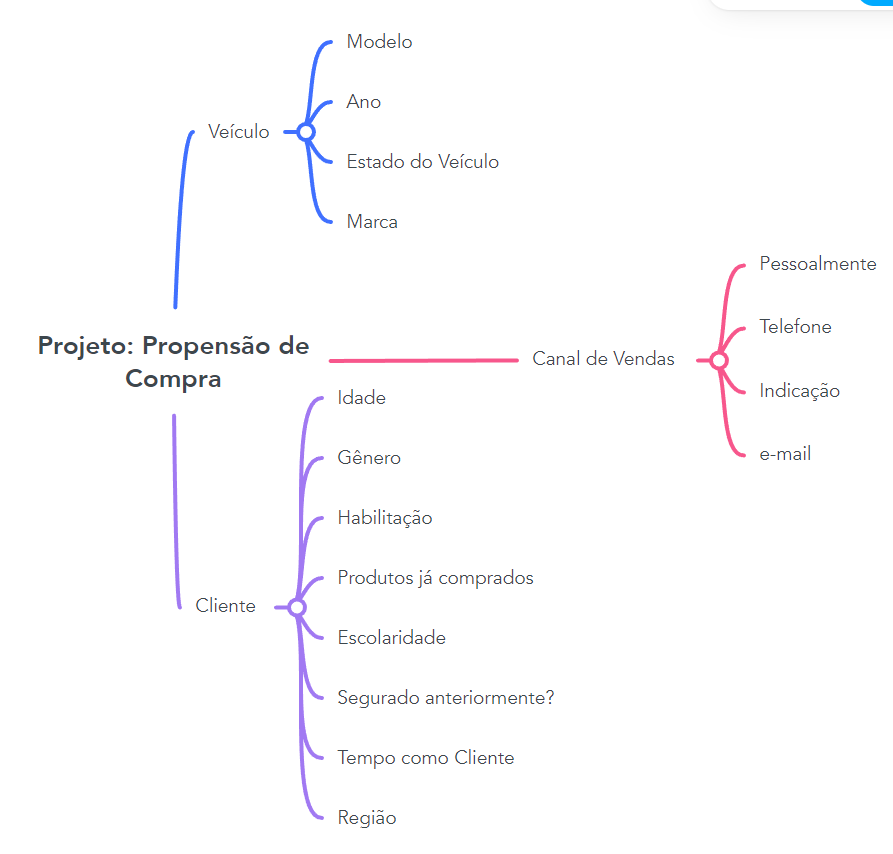

In [19]:
display(Image(filename='img/mapa_mental.png'))

### 4.1 Hipóteses

#### Hipóteses de Cliente

**1.** Clientes com o Gênero feminino estão mais propensas a adquirir um seguro veicular.

**2.** Clientes com maior escolaridade são mais propenso a adquirir um seguro veicular.

**3.** Clientes mais velhos são mais propenso a adquirir um seguro veicular.

**4.** Pessoas que possuem um maior tempo como cliente, são mais propensos a adquirir um seguro veicular.

**5.** Clientes não habilitados não adquirem seguros veiculares.

**6** A região de um cliente impacta diretamente se ele vai ou não adquirir um seguro veicular.

**7** Clientes que já possuiam um seguro veicular ativo são menos propensos a adquirir um seguro veicular.

#### Hipóteses de Veículos

**1.** Clientes com carros mais velhos são menos propensos a comprar um seguro.

**2.** Clientes que tiveram o carro danificado no passado são mais propensos a comprar um seguro.

**3.** A marca do veículo de um cliente impacta diretamente se ele vai ou não adquirir um seguro veicular.


#### Hipóteses de Canal de Vendas

**1.** Clientes que são indicados por outros clientes são mais propensos a adquirir um seguro veicular.

**2.** Clientes contatados pessoalmente são mais propensos a adquirir um seguro veicular.

**3.** Clientes contatdos por e-mail são menos propensos a adquirir um seguro veicular.

### 4.3 Filtragem dos Dados com base no negócio

##### Para esse projeto não iremos filtrar nenhum dado usando o conhecimento do negócio

## 5.0 Análise exploratória dos Dados

In [152]:
df2 = pd.read_csv('data/df1_train.csv',index_col=0)

### 5.1 Análise Univariada

#### 5.1.1 Variável Resposta

<AxesSubplot: xlabel='response', ylabel='count'>

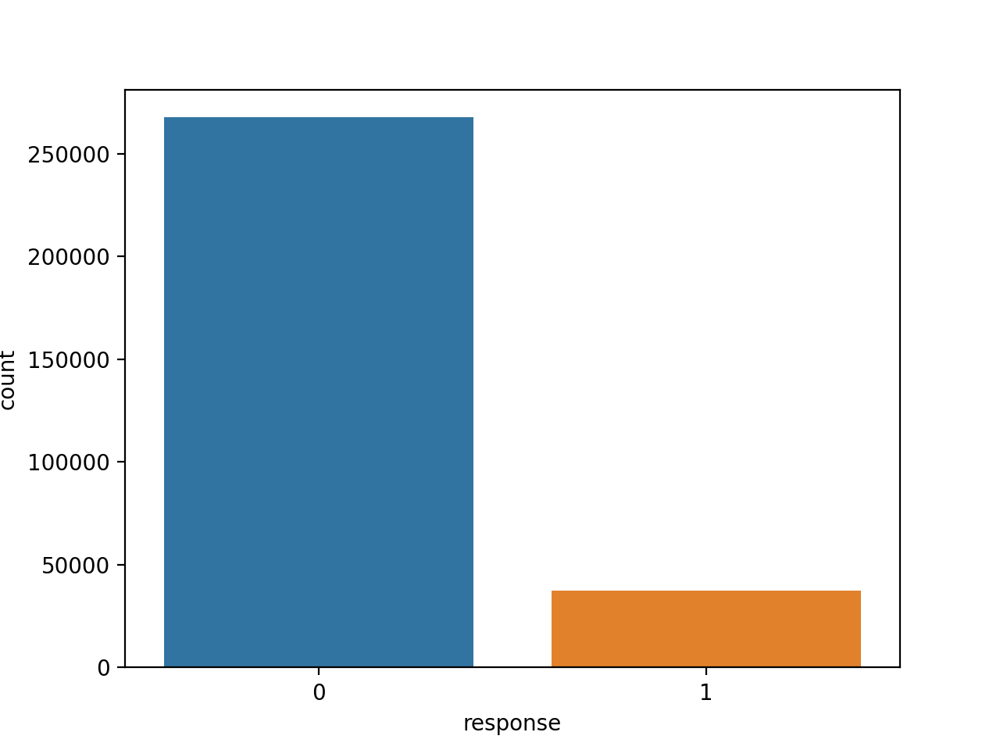

In [75]:
sns.countplot(x=df2['response'])

##### Como podemos ver os dados da variável resposta estão desbalanceados

#### 5.1.2 Distribuições

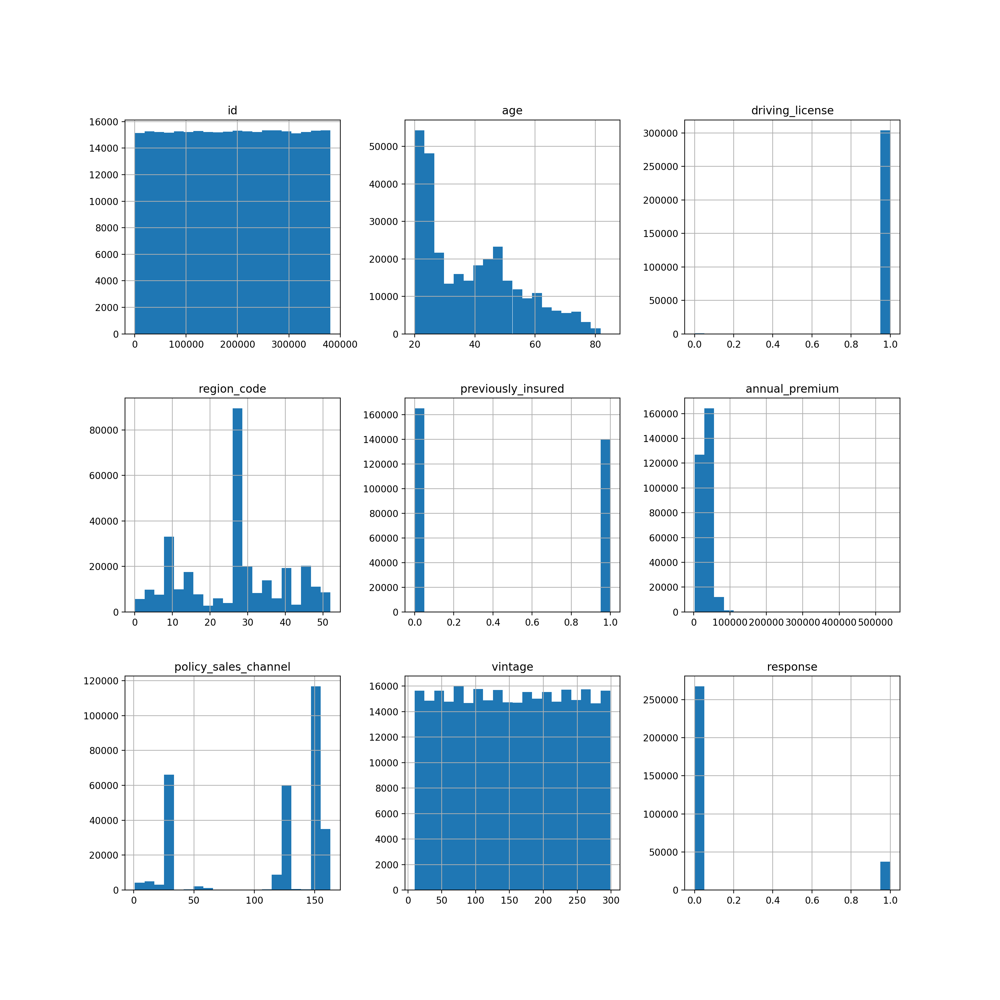

In [82]:
df2.hist(bins=20, figsize=[15,15]);

**Descobertas:**

**1.** Temos um grande número de clientes entre 20 e 30 anos

**2.** A imensa maioria dos clientes possuem habilitação

**3.** Temos um grande pico de clientes em uma região específica.


#### 5.1.3 Análise das Features Numéricas

<AxesSubplot: xlabel='response', ylabel='age'>

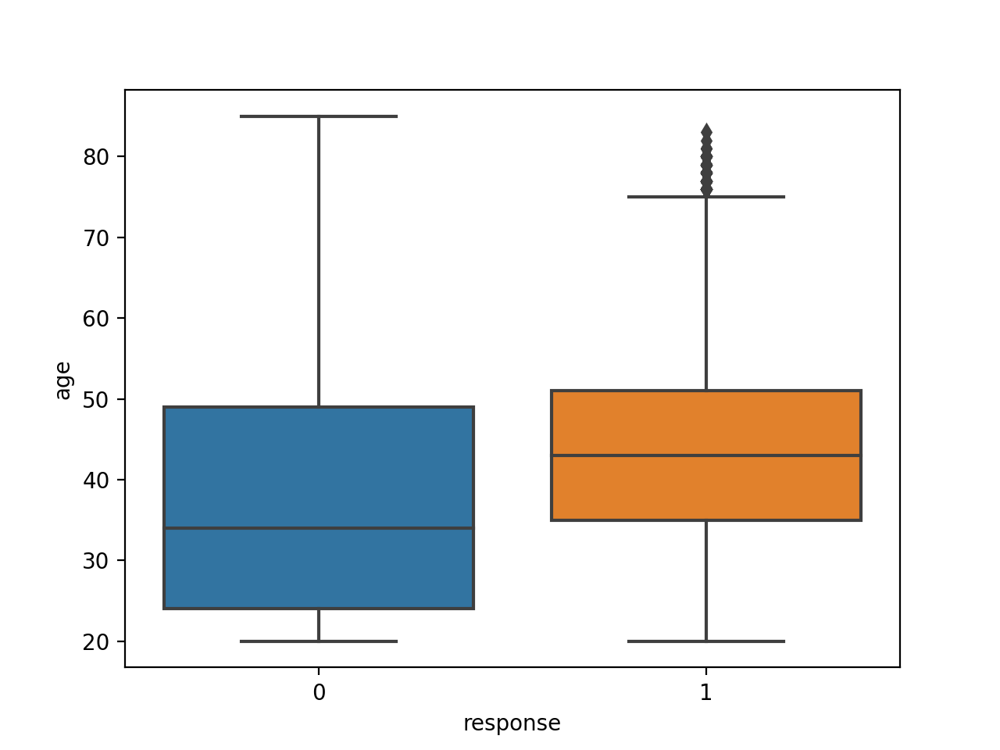

In [84]:
#Age - Aparentemente será relevante para nosso modelo, por discriminar um perfil de idade das pessoas que aceitaram
sns.boxplot(data=df2, x ='response', y='age')

<AxesSubplot: xlabel='age', ylabel='Count'>

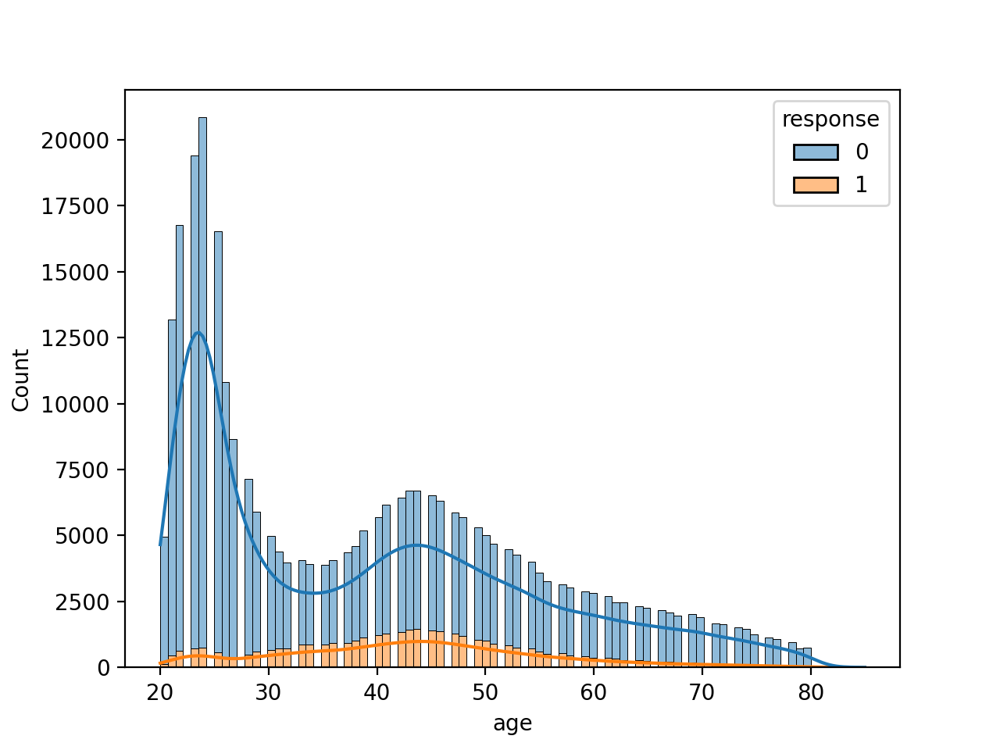

In [114]:
sns.histplot(data=df2, x='age', hue='response', multiple='stack', palette='tab10', kde=True)

<AxesSubplot: xlabel='response', ylabel='vintage'>

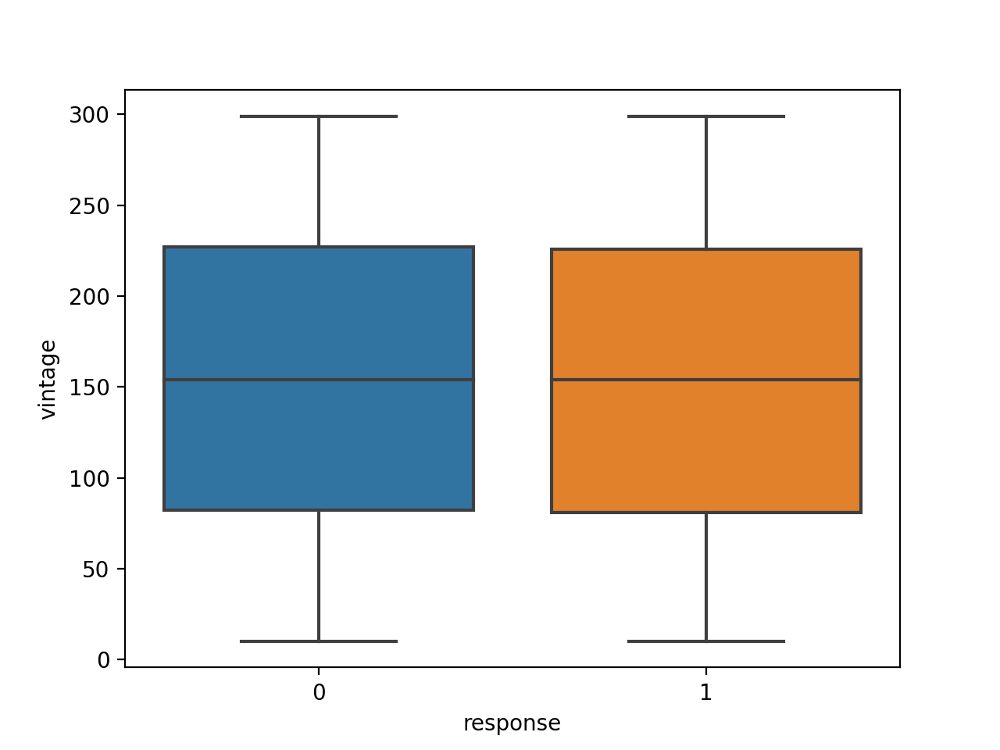

In [85]:
#vintage - Mão parece ser relevante de forma isolada para o nosso modelo
sns.boxplot(data=df2 , x ='response', y='vintage')

<AxesSubplot: xlabel='vintage', ylabel='Count'>

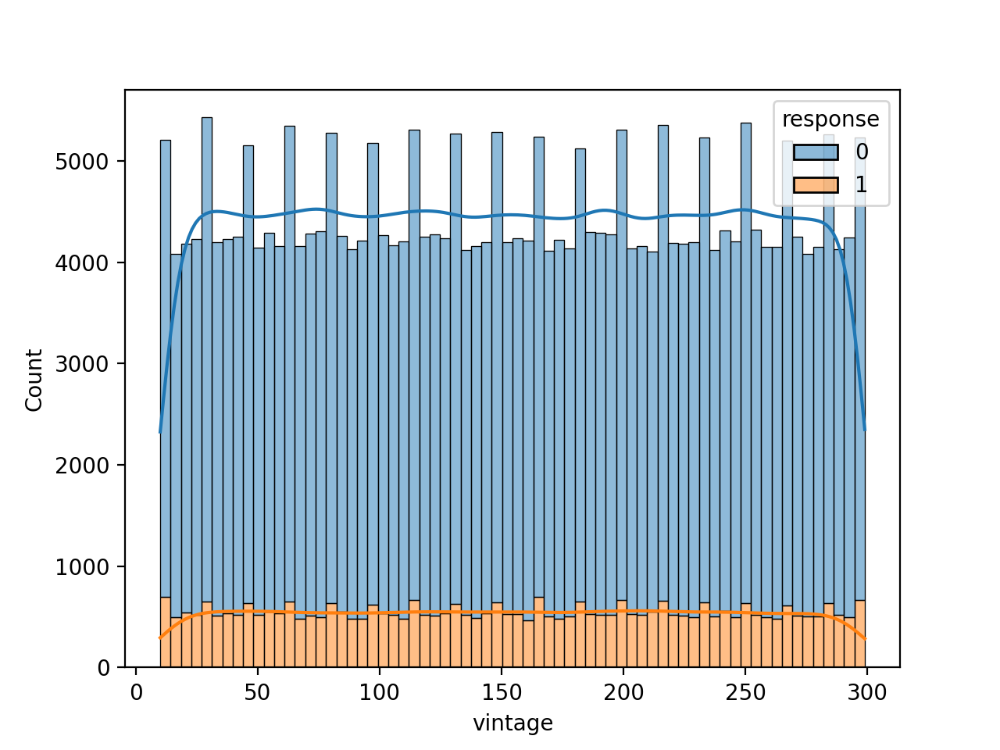

In [115]:
sns.histplot(data=df2, x='vintage', hue='response', multiple='stack', palette='tab10', kde=True)

<AxesSubplot: xlabel='response', ylabel='annual_premium'>

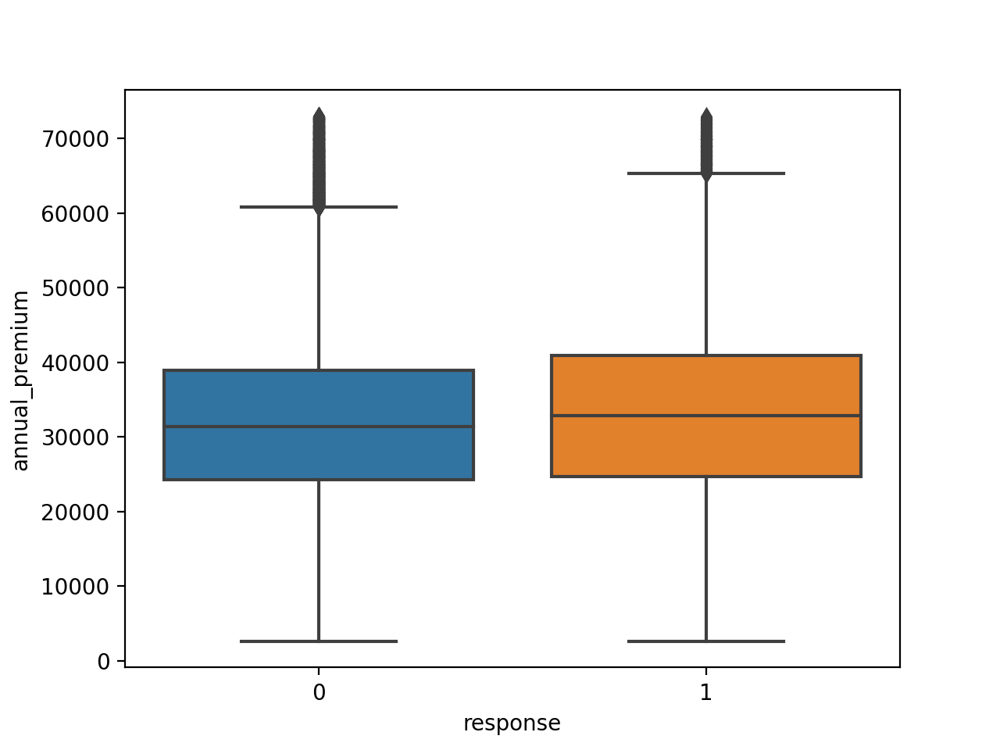

In [153]:
#annual_premium - Dados foram filtrados para melhor visualização (99% dos dados).
#Não parecem ser relevante de forma isolada para o nosso modelo
sns.boxplot(data=df2[df2['annual_premium'] < 72963] , x ='response', y='annual_premium')

<AxesSubplot: xlabel='annual_premium', ylabel='Count'>

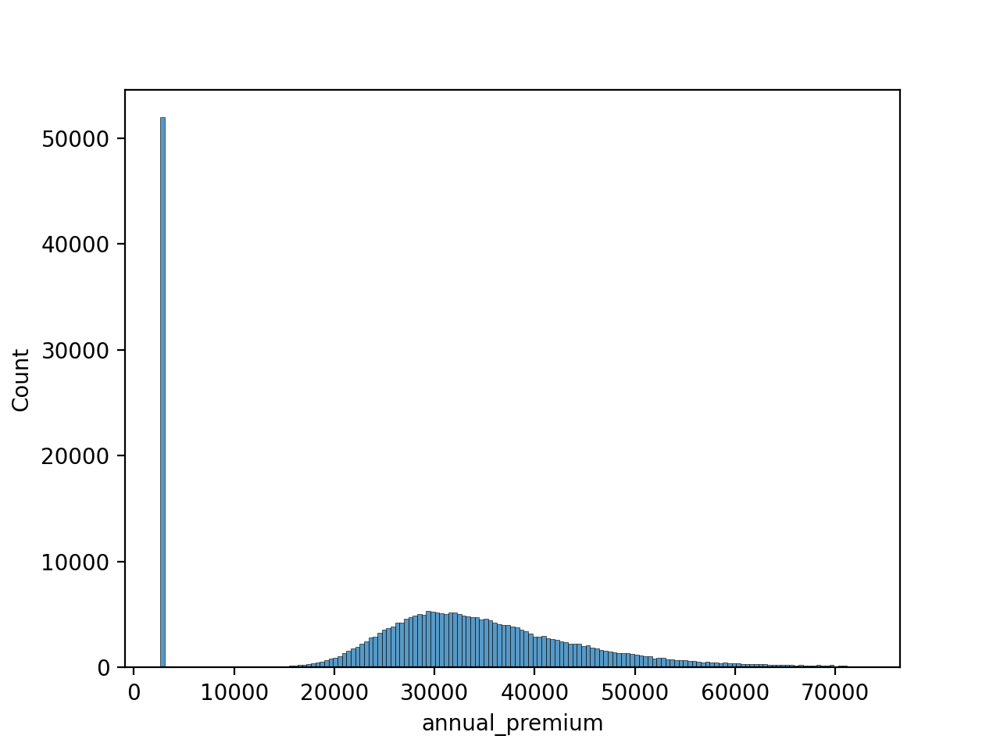

In [161]:
sns.histplot(data=df2[df2['annual_premium'] < 72963] , x ='annual_premium')

<AxesSubplot: xlabel='region_code', ylabel='id'>

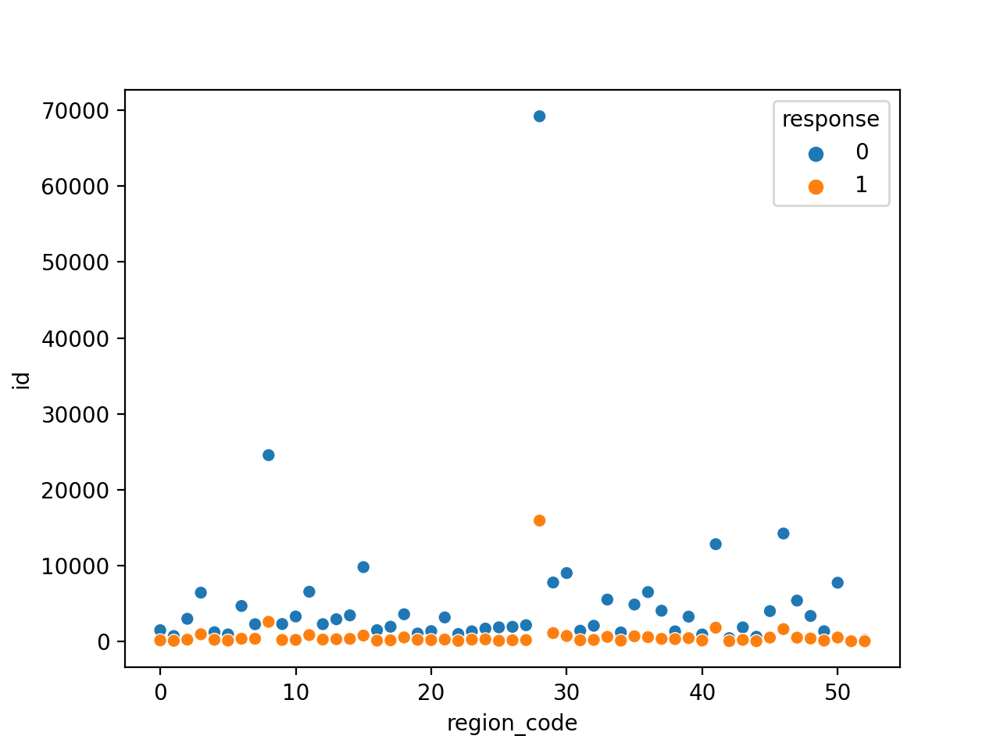

In [87]:
#region_code
sns.scatterplot(data= df2[['id', 'region_code', 'response']].groupby(['region_code','response']).count().reset_index(), hue = 'response', y='id', x='region_code')

<AxesSubplot: xlabel='policy_sales_channel', ylabel='id'>

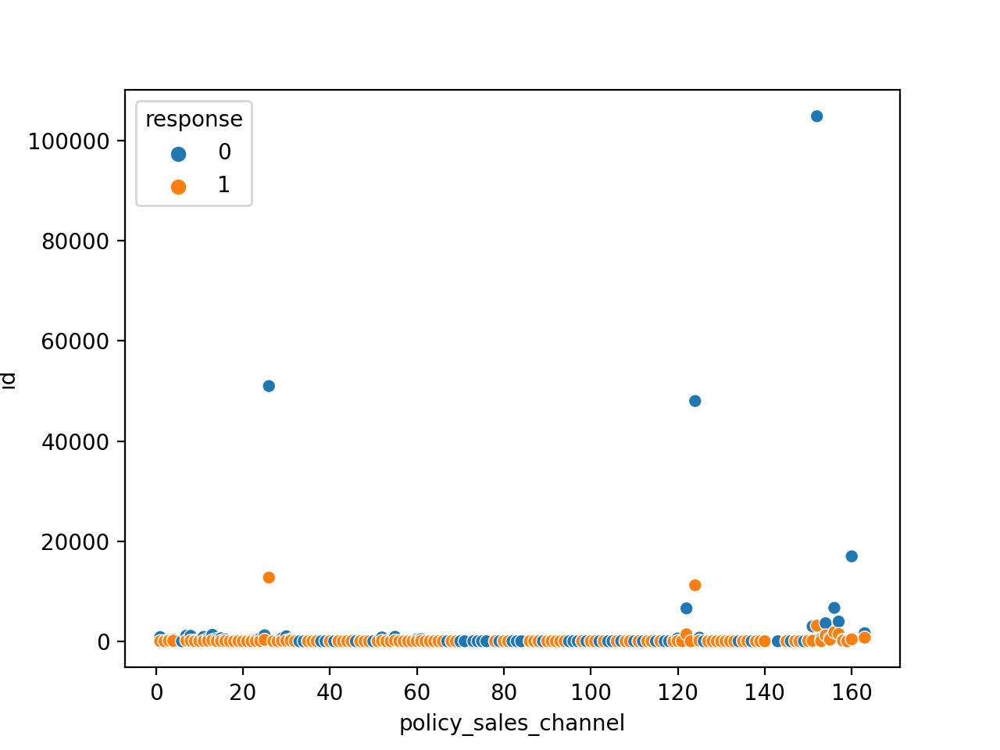

In [88]:
#policy_sales_channel
sns.scatterplot(data= df2[['id', 'policy_sales_channel', 'response']].groupby(['policy_sales_channel','response']).count().reset_index(), hue = 'response', y='id', x='policy_sales_channel')

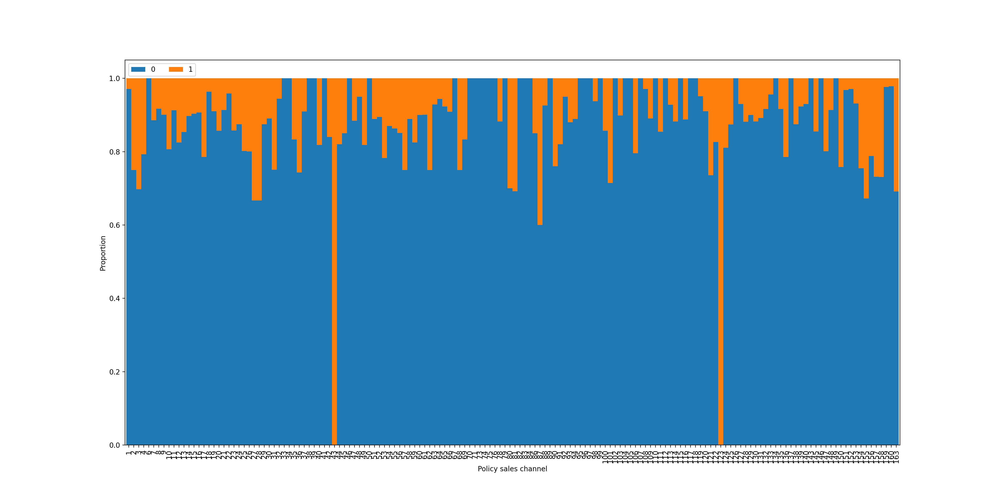

In [89]:
cross_tab_prop = pd.crosstab(index=df2['policy_sales_channel'],
                             columns=df2['response'],
                             normalize="index")
cross_tab_prop
cross_tab_prop.plot(kind='bar', 
                    stacked=True,  
                    figsize=(20,10),
                    width=1.0)
plt.legend(loc="upper left", ncol=2)
plt.xlabel("Policy sales channel")
plt.ylabel("Proportion")
plt.show()

#### 5.1.4 Análise das Features Categóricas

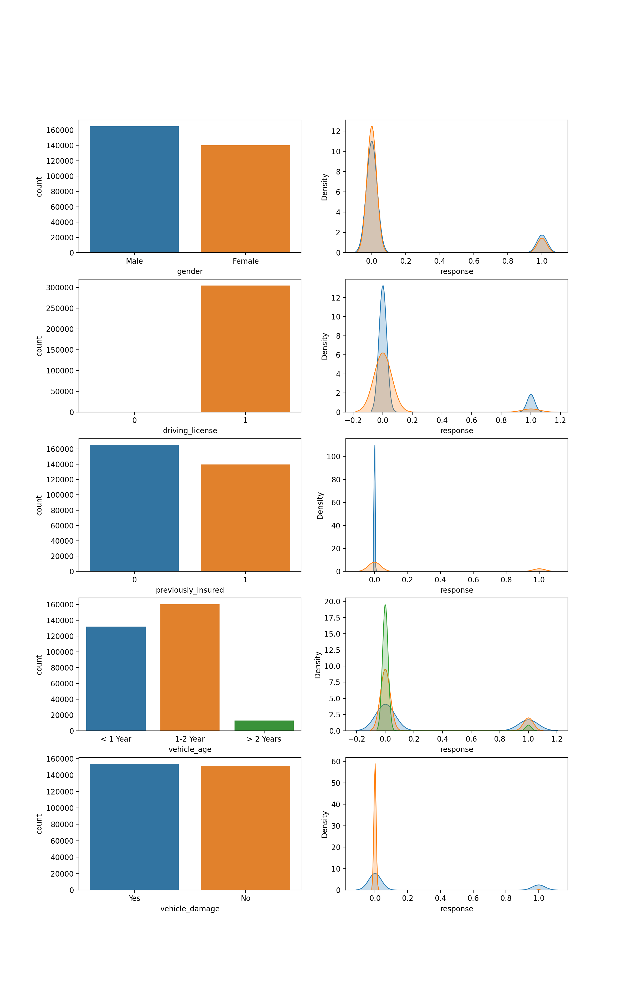

In [90]:
f = plt.figure(figsize=(12,19))

# Gender
f.add_subplot(521)
sns.countplot( x= df2['gender'] )

f.add_subplot(522)
sns.kdeplot( df2[df2['gender'] == 'Male']['response'],label='Male', fill=True )
sns.kdeplot( df2[df2['gender'] == 'Female']['response'],label='Female', fill=True )

# Driving License
f.add_subplot(523)
sns.countplot( x=df2['driving_license'] )

f.add_subplot(524)
sns.kdeplot( df2[df2['driving_license'] == 1]['response'], label='1', fill=True )
sns.kdeplot( df2[df2['driving_license'] == 0]['response'], label='0', fill=True )

# Previously Insured
f.add_subplot(525)
sns.countplot( x=df2['previously_insured'] )

f.add_subplot(526)
sns.kdeplot( df2[df2['previously_insured'] == 1]['response'], label='1', fill=True )
sns.kdeplot( df2[df2['previously_insured'] == 0]['response'], label='0', fill=True )

# Vehicle age
f.add_subplot(527)
sns.countplot( x=df2['vehicle_age'] )

f.add_subplot(528)
sns.kdeplot( df2[df2['vehicle_age'] == '> 2 Years']['response'], label='> 2 Years', fill=True )
sns.kdeplot( df2[df2['vehicle_age'] == '1-2 Year']['response'], label='1-2 Year', fill=True )
sns.kdeplot( df2[df2['vehicle_age'] == '< 1 Year']['response'], label='< 1 Year', fill=True )


# Vehicle Damage
f.add_subplot(529)
sns.countplot( x=df2['vehicle_damage'] )

f.add_subplot(5,2,10)
sns.kdeplot( df2[df2['vehicle_damage'] == 'Yes']['response'], label='Yes', fill=True )
sns.kdeplot( df2[df2['vehicle_damage'] == 'No']['response'], label='No', fill=True )


plt.show(f)

### 5.2 Análise Bivariada

**Hipótese 1.** Clientes com o Gênero feminino estão mais propensas a adquirir um seguro veicular.


**FALSA:** 60.9% das pessoas que compraram seguro são homens, indo um pouco mais a fundo, do total de mulheres contatadas apenas 10,43% compraram o seguro, enquanto que a porcentagem de homens que compraram foi de 13,81%

In [91]:
df2[['gender','response']].groupby('gender').count()

,response
gender,
Female,140107
Male,164780


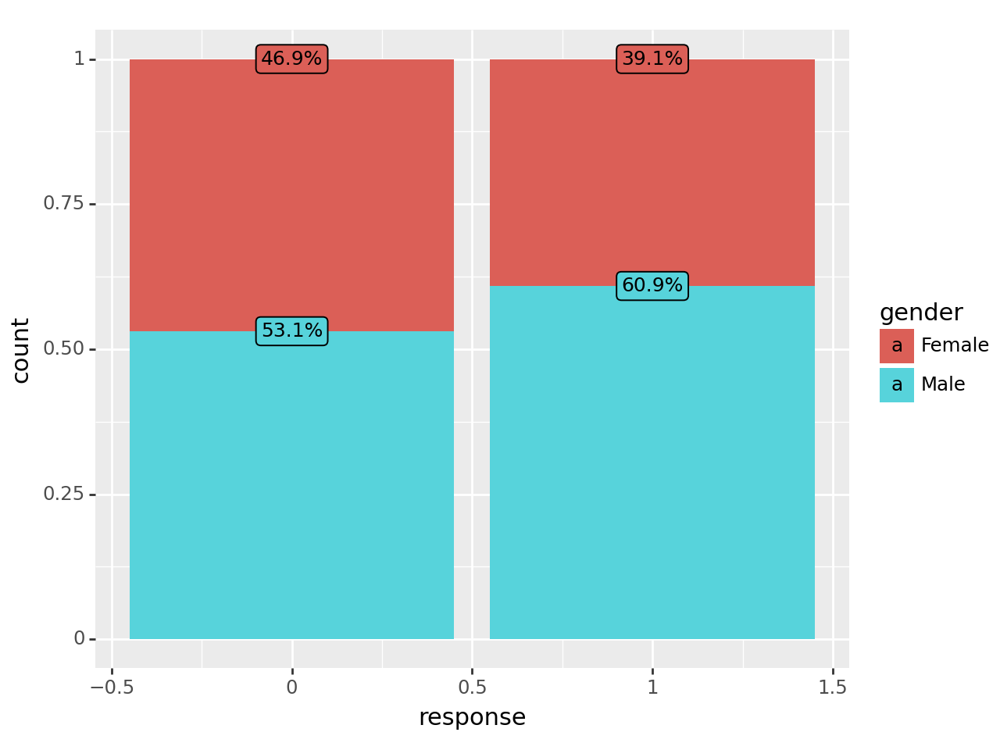

<Figure Size: (640 x 480)>

In [92]:
(ggplot(df2[['gender','response']], aes('response', fill='gender'))
     + geom_bar(position='fill')
     + geom_label(
                     aes(label=after_stat('prop_per_x(x, count) * 100')),
                     stat='count',
                     position='fill',
                     format_string='{:.1f}%',
                     size=9,)
)

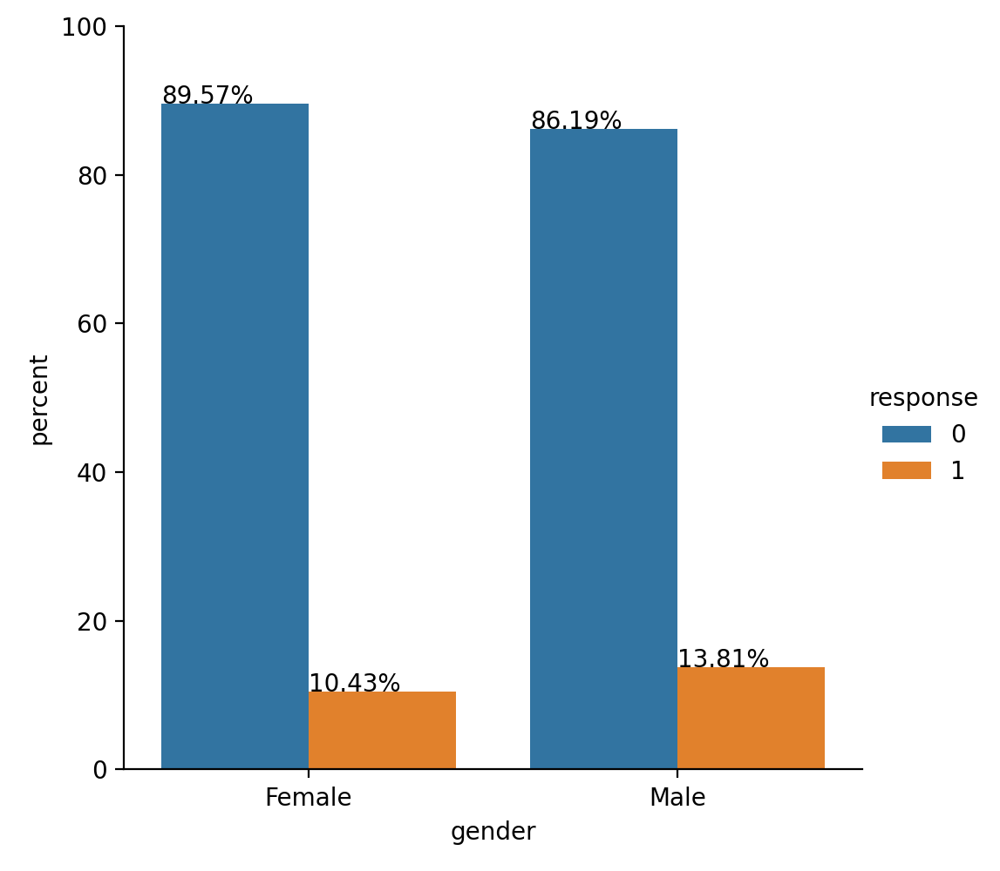

In [93]:
dfgraph = df2.groupby('gender')['response'].value_counts(normalize=True)
dfgraph = dfgraph.mul(100)
dfgraph = dfgraph.rename('percent').reset_index()

g = sns.catplot(x='gender',y='percent',hue='response',kind='bar',data=dfgraph)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**Hipótese 2.** Clientes com carros mais velhos são menos propensos a comprar um seguro.


**FALSO:** Em números totais, apenas 10,1% das pessoas com carros com idade maior que 2 anos se mostraram interessadas no seguro, porém relativo a quantidade de amostras foi a que obteve maior número de interessados, 29,28% das pessoas com carros mais velhos que 2 anos disseram sim, contra 17,37% de pessoas com carros de 1 a 2 anos e 4,39% das pessoas com carros com até 1 ano. Porém um adendo é que o número de pessoas na base com carros maior que dois anos é muito inferior as outras duas categorias. Para validar completamente essa hipótese precisariamos de mais amostras de clientes com carros mais velhos que 2 anos.

In [33]:
df2[['vehicle_age','response']].groupby('vehicle_age').count()

,response
vehicle_age,
1-2 Year,200316
< 1 Year,164786
> 2 Years,16007


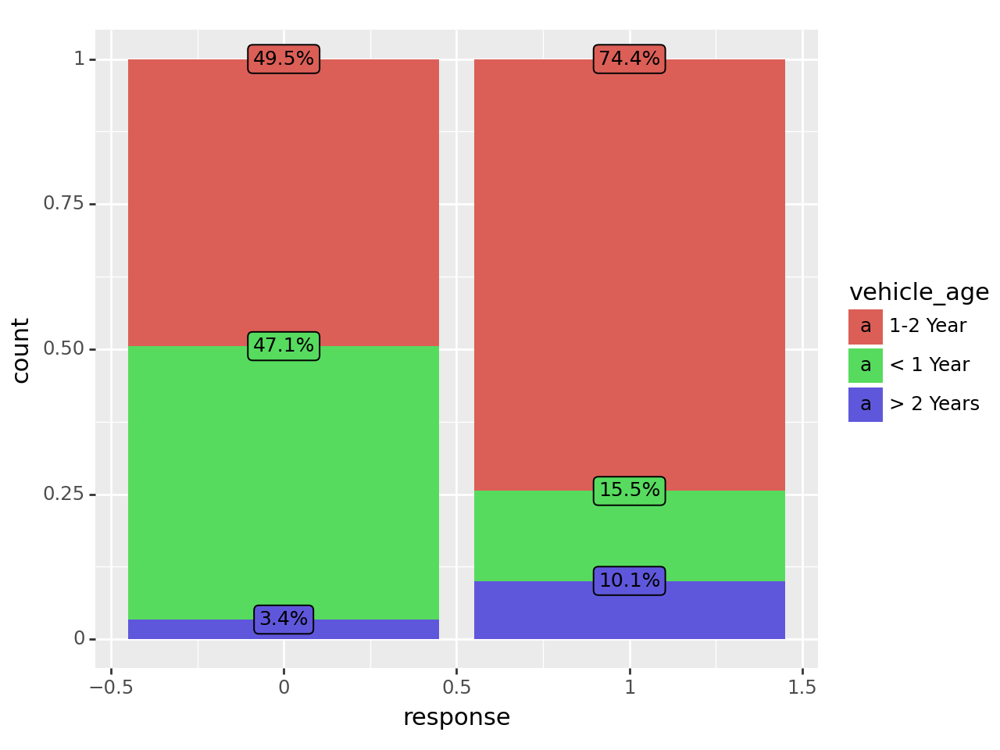

<Figure Size: (640 x 480)>

In [94]:
(ggplot(df2[['vehicle_age','response']], aes('response', fill='vehicle_age'))
     + geom_bar(position='fill')
     + geom_label(
                     aes(label=after_stat('prop_per_x(x, count) * 100')),
                     stat='count',
                     position='fill',
                     format_string='{:.1f}%',
                     size=9,)
)

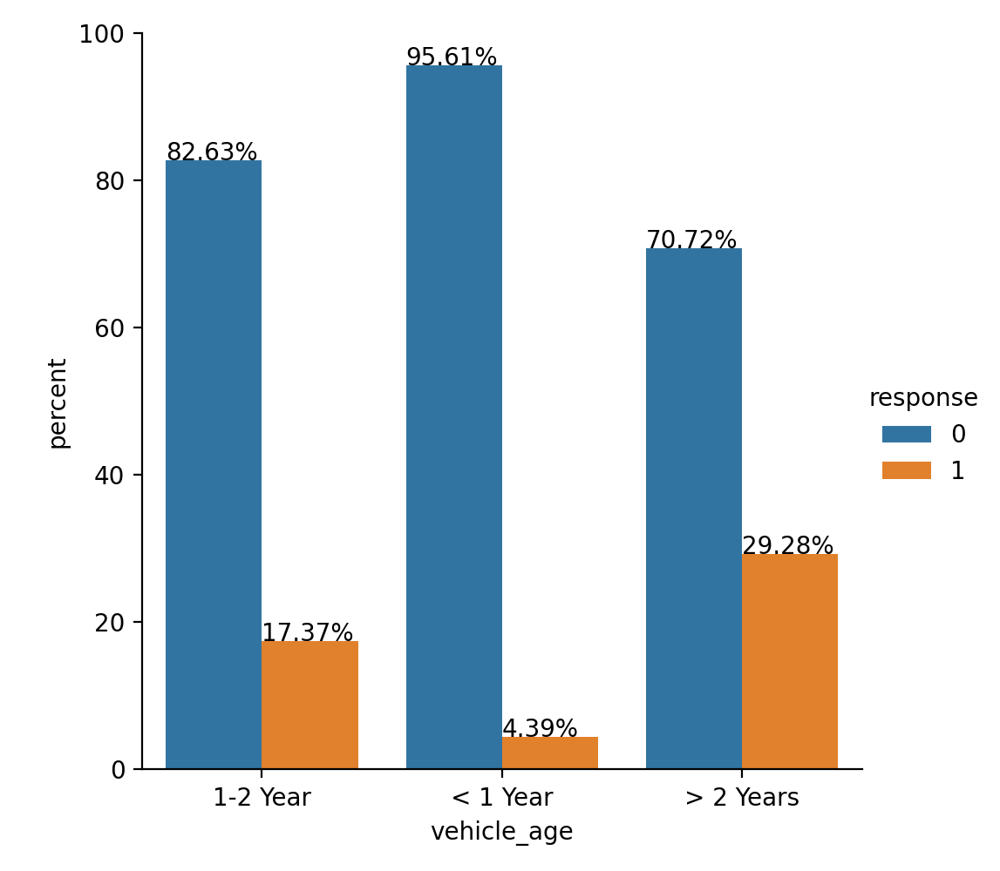

In [95]:
dfgraph = df2.groupby('vehicle_age')['response'].value_counts(normalize=True)
dfgraph = dfgraph.mul(100)
dfgraph = dfgraph.rename('percent').reset_index()

g = sns.catplot(x='vehicle_age',y='percent',hue='response',kind='bar',data=dfgraph)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**Hipótese 3.** Clientes que tiveram o carro danificado no passado são mais propensos a comprar um seguro.


**Verdadeiro:** 97.9% das pessoas que aceitram o seguro o carro já havia sido danificado anteriormente. 

In [96]:
df2[['vehicle_damage','response', 'id']].groupby(['vehicle_damage','response']).count()

id
vehicle_damage response        
No             0         150134
               1            794
Yes            0         117385
               1          36574

In [97]:
fig = px.pie(df2, values='response', names='vehicle_damage')
fig.show()

**Hipótese 4.** Clientes que já possuiam um seguro veicular ativo são menos propensos a adquirir um seguro veicular.


**VERDADEIRO:** Apenas 0.08% dos clientes que possuiam um seguro veicular anterior se interessou pelo novo seguro oferecido

In [98]:
df2[['previously_insured','response', 'id']].groupby(['previously_insured','response']).count()

id
previously_insured response        
0                  0         127960
                   1          37250
1                  0         139559
                   1            118

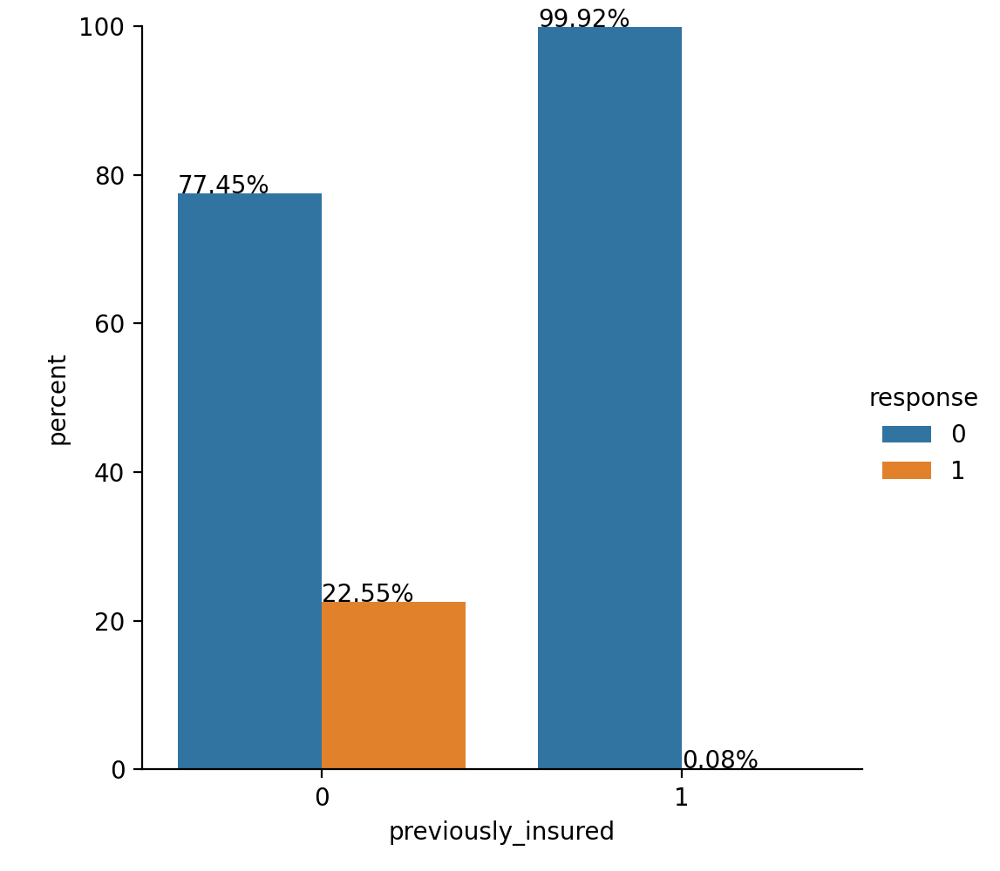

In [99]:
dfgraph = df2.groupby('previously_insured')['response'].value_counts(normalize=True)
dfgraph = dfgraph.mul(100)
dfgraph = dfgraph.rename('percent').reset_index()

g = sns.catplot(x='previously_insured',y='percent',hue='response',kind='bar',data=dfgraph)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**Hipótese 5.** Pessoas que possuem um maior tempo como cliente, são mais propensos a adquirir um seguro veicular.


**FALSO:** Não a quaisquer relação observável entre o tempo como cliente e a proporção entre estar interessada no seguro ou não

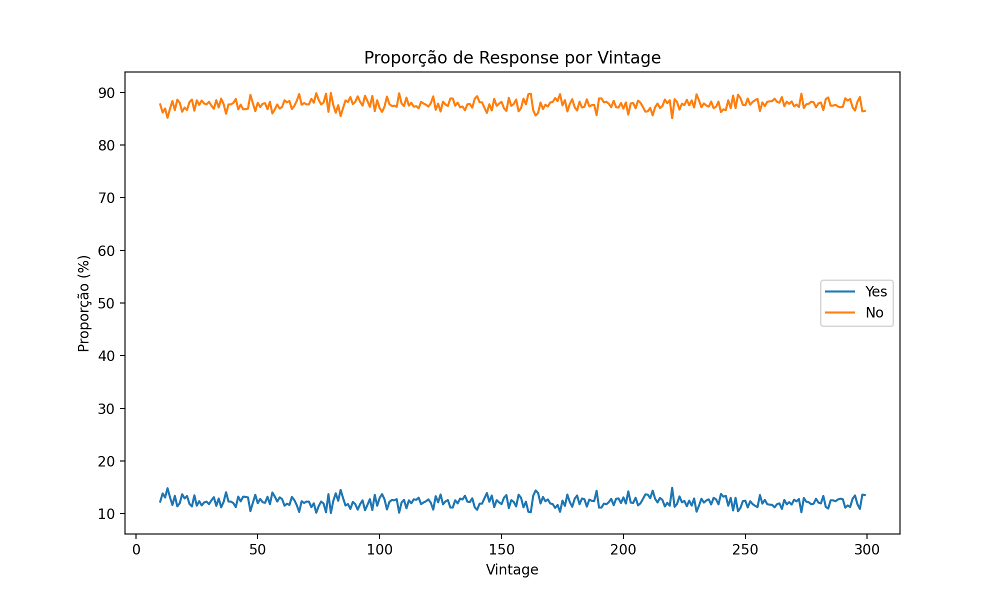

In [100]:
df_modified = df2.copy()
df_modified['response'] = df_modified['response'].replace({1: 'Yes', 0: 'No'})
proporcao_response = df_modified.groupby('vintage')['response'].value_counts(normalize=True).mul(100).unstack()
plt.figure(figsize=(10, 6))
plt.plot(proporcao_response.index, proporcao_response['Yes'], label='Yes')
plt.plot(proporcao_response.index, proporcao_response['No'], label='No')
plt.xlabel('Vintage')
plt.ylabel('Proporção (%)')
plt.title('Proporção de Response por Vintage')
plt.legend()
plt.show()


**Hipótese 6.** Clientes não habilitados não adquirem seguros veiculares.


**FALSO:** 34 clientes sem carta adquiriram o seguro. O que representa 0,091% das pessoas que adquiriram seguro. É um número extremamente baixo, portanto podemos dizer que a grande maioria dos interessados em seguro são habilitados.

In [101]:
df2[['driving_license', 'id']][df2['response']==1].groupby(['driving_license']).count().unstack().reset_index()

,level_0,driving_license,0
0,id,0,34
1,id,1,37334


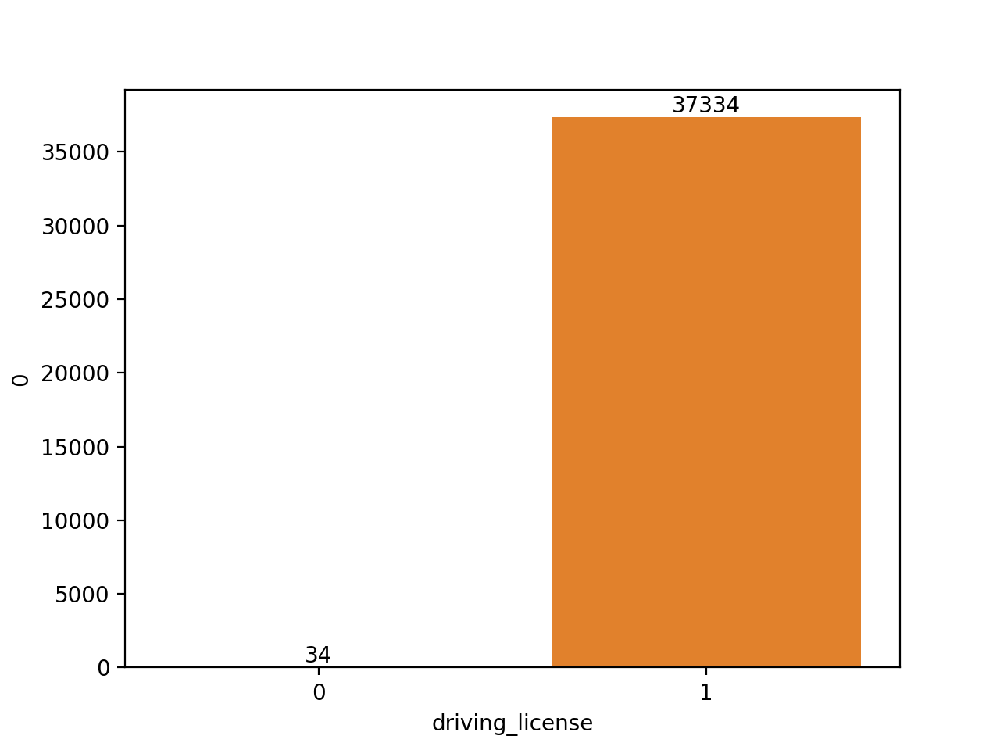

In [102]:
ax = sns.barplot(df2[['driving_license', 'id']][df2['response']==1].groupby(['driving_license']).count().unstack().reset_index(), x='driving_license', y=0)
for i in ax.containers:
    ax.bar_label(i,)

In [103]:
px.pie(df2[['driving_license', 'id']][df2['response']==1].groupby(['driving_license']).count().unstack().reset_index(), values=0, names='driving_license')

### 5.3 Análise Multivariada

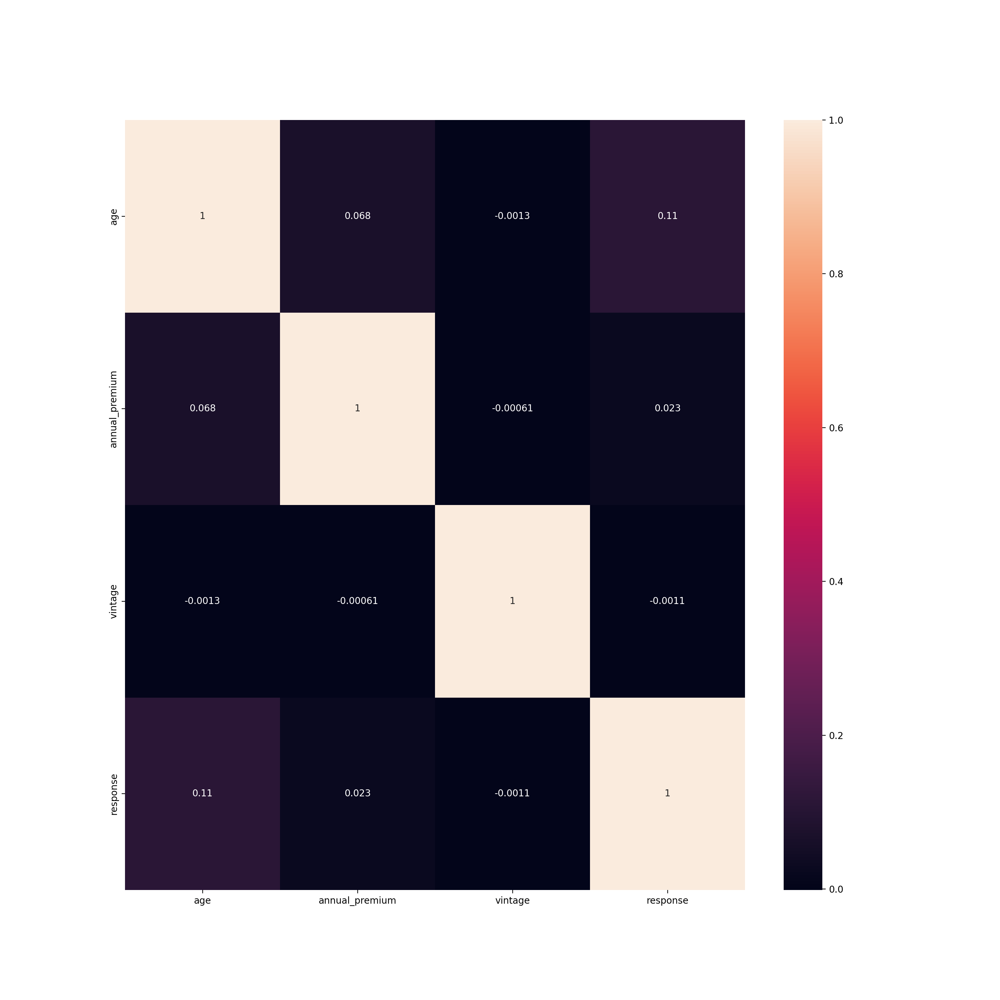

In [112]:
fig = plt.figure(figsize=[15,15])
fig = sns.heatmap(df_num.corr( method='pearson'), annot=True)

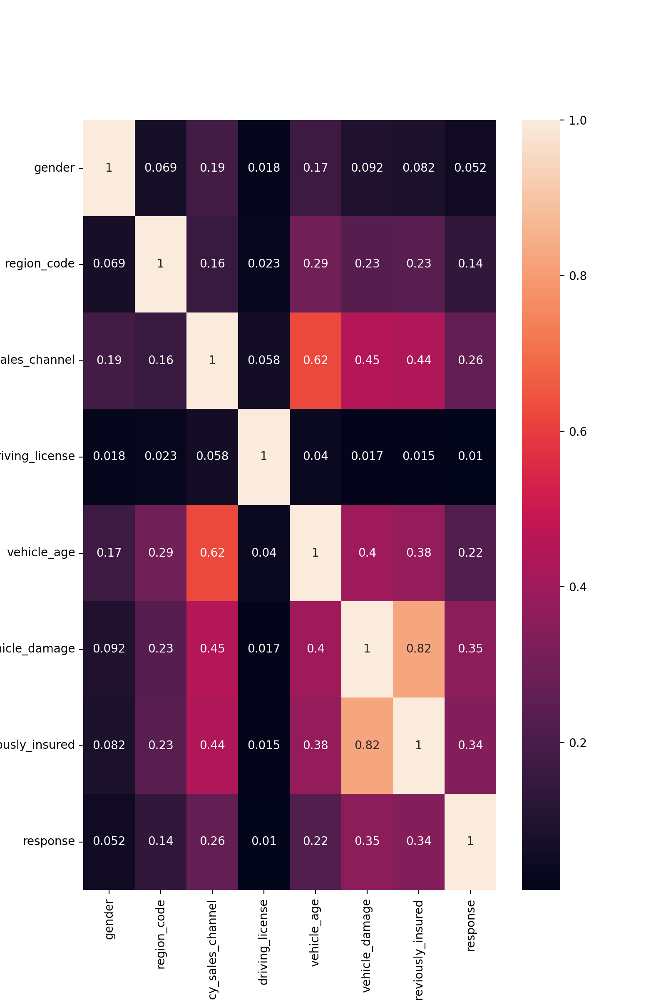

In [105]:
df_cat = df_cat.astype("category")

cramersv = am.CramersV(df_cat) 
df_heat=cramersv.fit()

f = plt.figure(figsize=(8,12))
f= sns.heatmap( df_heat, annot=True );

In [197]:
#Salvando dados
df2.to_csv('data/df_eda_done.csv')

## 6.0 Preparação dos Dados

In [239]:
df3 = pd.read_csv('data/df_eda_done.csv',index_col=0)

### 6.1 Criação de Features

##### Para esse projeto não iremos criar nenhuma nova Feature

### 6.2 Standardization

A coluna annual_premium quando filtrada apresenta uma distribuicao proxima da normal, neste primeiro ciclo utilizaremos a tecnica de Standardization sem tratar os outliers para ver qual será o resultado. Em um próximo ciclo, podemos tratar os outliers utilizando tecnicas de substituicao ou remocao. Porem afim de minimizar o efeito dos outliers utilizaremos o RobustScaler

In [241]:
#annual_premium
robust_scaler = pp.RobustScaler()
df3['annual_premium'] = robust_scaler.fit_transform( df3[['annual_premium']].values )
pickle.dump (robust_scaler, open ('pkl/annual_premium_scaler.pkl', 'wb') )

### 6.3 Rescaling

In [242]:
#age
age_scaler = pp.MinMaxScaler()
df3['age'] = age_scaler.fit_transform( df3[['age']].values )
pickle.dump (age_scaler, open ('pkl/age_scaler.pkl', 'wb') )

#vintage
vintage_scaler = pp.MinMaxScaler()
df3['vintage'] = vintage_scaler.fit_transform( df3[['vintage']].values )
pickle.dump (vintage_scaler, open ('pkl/vintage_scaler.pkl', 'wb') )

### 6.4 Encoding

In [243]:
#previously_insured - Não é necessário
#driving_license - Não é necessário

#gender - one hot encoding
df3 = pd.get_dummies(df3,prefix='gender',columns=['gender'])

#region_code - target encoder
region_encoder= ce.TargetEncoder(cols='region_code') 
df3['region_code'] = region_encoder.fit_transform(df3['region_code'],df3['response'])
pickle.dump (region_encoder, open ('pkl/region_code_encoder.pkl', 'wb') )
                      
#vehicle_age - Ordinal encoder
mapping = {"< 1 Year": 1,  "1-2 Year": 2, "> 2 Years": 3}
df3['vehicle_age'] = df3['vehicle_age'].map(mapping)

#vehicle_damage - Label Encoder
vd_le = pp.LabelEncoder()
df3['vehicle_damage'] = vd_le.fit_transform( df3['vehicle_damage'].values)
pickle.dump (vd_le, open ('pkl/vehicle_damage_encoder.pkl', 'wb') )

#policy_sales_channel - Target encoder
sales_channel_encoder= ce.TargetEncoder(cols='policy_sales_channel') 
df3['policy_sales_channel'] = sales_channel_encoder.fit_transform(df3['policy_sales_channel'],df3['response'])
pickle.dump (sales_channel_encoder, open ('pkl/sales_channel_encoder.pkl', 'wb') )

In [271]:
df3.isna().sum()

id                      0
age                     0
driving_license         0
region_code             0
previously_insured      0
vehicle_age             0
vehicle_damage          0
annual_premium          0
policy_sales_channel    0
vintage                 0
response                0
gender_Female           0
gender_Male             0
dtype: int64

In [272]:
#Salvando dados
df3.to_csv('data/df_data_prep_done.csv')

### 6.5 Preparacao dados de teste

In [266]:
df_teste = pd.read_csv('data/df_test_split.csv',index_col=0)

In [267]:
df_teste

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,response
16221,16222,Male,54,1,28,0,> 2 Years,Yes,75219.0,26,53,1
342480,342481,Female,26,1,3,0,1-2 Year,Yes,19738.0,156,280,0
20915,20916,Male,25,1,28,0,< 1 Year,Yes,61524.0,124,255,0
38703,38704,Male,29,1,24,0,1-2 Year,Yes,2630.0,157,235,1
363808,363809,Female,28,1,28,0,< 1 Year,Yes,51473.0,26,243,1
...,...,...,...,...,...,...,...,...,...,...,...,...
151614,151615,Male,40,1,28,0,1-2 Year,Yes,32747.0,124,140,0
170170,170171,Female,39,1,48,0,1-2 Year,No,2630.0,124,178,0
303221,303222,Male,60,1,28,0,1-2 Year,Yes,36965.0,26,285,0
333829,333830,Male,23,1,15,1,< 1 Year,No,28270.0,152,98,0


In [268]:
#annual_premium
df_teste['annual_premium'] = robust_scaler.transform( df_teste[['annual_premium']].values )

#age
df_teste['age'] = age_scaler.transform( df_teste[['age']].values )

#vintage
df_teste['vintage'] = vintage_scaler.transform( df_teste[['vintage']].values )

#gender - one hot encoding
df_teste = pd.get_dummies(df_teste,prefix='gender',columns=['gender'])

#region_code - target encoder
df_teste['region_code'] = region_encoder.transform(df_teste['region_code'])
                      
#vehicle_age - Ordinal encoder
df_teste['vehicle_age'] = df_teste['vehicle_age'].map(mapping)

#vehicle_damage - Label Encoder
df_teste['vehicle_damage'] = vd_le.transform( df_teste['vehicle_damage'].values)

#policy_sales_channel - Target encoder
df_teste['policy_sales_channel'] = sales_channel_encoder.transform(df_teste['policy_sales_channel'])

In [270]:
df_teste.isna().sum()

id                      0
age                     0
driving_license         0
region_code             0
previously_insured      0
vehicle_age             0
vehicle_damage          0
annual_premium          0
policy_sales_channel    0
vintage                 0
response                0
gender_Female           0
gender_Male             0
dtype: int64

In [273]:
#Salvando dados
df_teste.to_csv('data/df_test_data_prep_done.csv')

## 6.0 Seleção de Features